# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
from time import time
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from lightgbm import LGBMClassifier
from wordcloud import WordCloud
import plotly.offline as offline
import plotly.graph_objs as go

import os

/opt/conda/lib/python3.6/site-packages/smart_open/ssh.py:34: UserWarning: paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress
  warnings.warn('paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress')


In [2]:
# using SQLite Table to read data.
con = sqlite3.connect('../input/database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 5000""", con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (5000, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [3]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [4]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B005ZBZLT4,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ESG,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B005ZBZLT4,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ESG,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBEV0,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [5]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B001ATMQK2,"undertheshrine ""undertheshrine""",1296691200,5,I bought this 6 pack because for the price tha...,5


In [6]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [7]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [8]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [9]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(4986, 10)

In [10]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

99.72

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [11]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [12]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [13]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(4986, 10)


1    4178
0     808
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [14]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[4900]
print(sent_4900)
print("="*50)

Why is this $[...] when the same product is available for $[...] here?<br />http://www.amazon.com/VICTOR-FLY-MAGNET-BAIT-REFILL/dp/B00004RBDY<br /><br />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.
I recently tried this flavor/brand and was surprised at how delicious these chips are.  The best thing was that there were a lot of "brown" chips in the bsg (my favorite), so I bought some more through amazon and shared with family and friends.  I am a little disappointed that there are not, so far, very many brown chips in these bags, but the flavor is still very good.  I like them better than the yogurt and green onion flavor because they do not seem to be as salty, and the onion flavor is better.  If you haven't eaten Kettle chips before, I recommend that you try a bag before buying bulk.  They are thicker and crunchier than Lays but just as fresh out of the bag.
Wow.  So far, two two-star reviews.  One obviously had no 

In [15]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

Why is this $[...] when the same product is available for $[...] here?<br /> /><br />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.


In [16]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

Why is this $[...] when the same product is available for $[...] here? />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.
I recently tried this flavor/brand and was surprised at how delicious these chips are.  The best thing was that there were a lot of "brown" chips in the bsg (my favorite), so I bought some more through amazon and shared with family and friends.  I am a little disappointed that there are not, so far, very many brown chips in these bags, but the flavor is still very good.  I like them better than the yogurt and green onion flavor because they do not seem to be as salty, and the onion flavor is better.  If you haven't eaten Kettle chips before, I recommend that you try a bag before buying bulk.  They are thicker and crunchier than Lays but just as fresh out of the bag.
Wow.  So far, two two-star reviews.  One obviously had no idea what they were ordering; the other wants crispy cookies.  Hey, I'm sorry; b

In [17]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [18]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

Wow.  So far, two two-star reviews.  One obviously had no idea what they were ordering; the other wants crispy cookies.  Hey, I am sorry; but these reviews do nobody any good beyond reminding us to look  before ordering.<br /><br />These are chocolate-oatmeal cookies.  If you do not like that combination, do not order this type of cookie.  I find the combo quite nice, really.  The oatmeal sort of "calms" the rich chocolate flavor and gives the cookie sort of a coconut-type consistency.  Now let is also remember that tastes differ; so, I have given my opinion.<br /><br />Then, these are soft, chewy cookies -- as advertised.  They are not "crispy" cookies, or the blurb would say "crispy," rather than "chewy."  I happen to like raw cookie dough; however, I do not see where these taste like raw cookie dough.  Both are soft, however, so is this the confusion?  And, yes, they stick together.  Soft cookies tend to do that.  They are not individually wrapped, which would add to the cost.  Oh y

In [19]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

Why is this $[...] when the same product is available for $[...] here?<br /> /><br />The Victor  and  traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.


In [20]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

Wow So far two two star reviews One obviously had no idea what they were ordering the other wants crispy cookies Hey I am sorry but these reviews do nobody any good beyond reminding us to look before ordering br br These are chocolate oatmeal cookies If you do not like that combination do not order this type of cookie I find the combo quite nice really The oatmeal sort of calms the rich chocolate flavor and gives the cookie sort of a coconut type consistency Now let is also remember that tastes differ so I have given my opinion br br Then these are soft chewy cookies as advertised They are not crispy cookies or the blurb would say crispy rather than chewy I happen to like raw cookie dough however I do not see where these taste like raw cookie dough Both are soft however so is this the confusion And yes they stick together Soft cookies tend to do that They are not individually wrapped which would add to the cost Oh yeah chocolate chip cookies tend to be somewhat sweet br br So if you wa

In [21]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [22]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|██████████| 4986/4986 [00:02<00:00, 2306.20it/s]


In [23]:
preprocessed_reviews[1500]

'wow far two two star reviews one obviously no idea ordering wants crispy cookies hey sorry reviews nobody good beyond reminding us look ordering chocolate oatmeal cookies not like combination not order type cookie find combo quite nice really oatmeal sort calms rich chocolate flavor gives cookie sort coconut type consistency let also remember tastes differ given opinion soft chewy cookies advertised not crispy cookies blurb would say crispy rather chewy happen like raw cookie dough however not see taste like raw cookie dough soft however confusion yes stick together soft cookies tend not individually wrapped would add cost oh yeah chocolate chip cookies tend somewhat sweet want something hard crisp suggest nabiso ginger snaps want cookie soft chewy tastes like combination chocolate oatmeal give try place second order'

<h2><font color='red'>[3.2] Preprocessing Review Summary</font></h2>

In [24]:
## Similartly you can do preprocessing for review summary also.
# Combining all the above stundents 
preprocessed_summary = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Summary'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_summary.append(sentance.strip())

100%|██████████| 4986/4986 [00:01<00:00, 3483.02it/s]


### [3.3] Split Dataset into Train and Test

In [25]:
from sklearn import model_selection as ms
y=final['Score'][:5000]
dw_train,dw_test,y_train,y_test=ms.train_test_split(preprocessed_reviews, y, stratify=y, test_size=0.3, random_state=0)

# [4] Featurization

## [4.1] BAG OF WORDS

In [26]:
#BoW
count_vect = CountVectorizer(dtype='float') #in scikit-learn
d_train =count_vect.fit_transform(dw_train)
print("some feature names ", count_vect.get_feature_names()[:10])
print('='*50)

some feature names  ['aa', 'aahhhs', 'aback', 'abandon', 'abates', 'abbott', 'abdominal', 'abiding', 'ability', 'able']


In [27]:
print("the type of count vectorizer ",type(d_train))
print("the shape of train-text BOW vectorizer ",d_train.get_shape())

d_test = count_vect.transform(dw_test)
print("the shape of test-text BOW vectorizer ",d_test.get_shape())

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of train-text BOW vectorizer  (3490, 10906)
the shape of test-text BOW vectorizer  (1496, 10906)


## [4.2] Bi-Grams and n-Grams.

In [28]:
#bi-gram, tri-gram and n-gram

#removing stop words like "not" should be avoided before building n-grams
# count_vect = CountVectorizer(ngram_range=(1,2))
# please do read the CountVectorizer documentation http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

# you can choose these numebrs min_df=10, max_features=5000, of your choice
count_vect_gram = CountVectorizer(ngram_range=(1,2), min_df=10, max_features=5000)
d_train_gram = count_vect_gram.fit_transform(dw_train)

In [29]:
#Vectorize cv and test data
print("the type of count vectorizer ",type(d_train_gram))
print("the shape of train-text BOW vectorizer ",d_train_gram.get_shape())

d_test_gram = count_vect_gram.transform(dw_test)
print("the shape of test-text BOW vectorizer ",d_test_gram.get_shape())

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of train-text BOW vectorizer  (3490, 2267)
the shape of test-text BOW vectorizer  (1496, 2267)


## [4.3] TF-IDF

In [30]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2), min_df=10)
d_train_tf =tf_idf_vect.fit_transform(dw_train)
print("some sample features(unique words in the corpus)",tf_idf_vect.get_feature_names()[0:10])
print('='*50)

some sample features(unique words in the corpus) ['able', 'able find', 'absolute', 'absolutely', 'absolutely delicious', 'absolutely love', 'according', 'acid', 'across', 'active']


In [31]:
#Vectorize cv and test data
print("the type of count vectorizer ",type(d_train_tf))
print("the shape of train-text BOW vectorizer ",d_train_tf.get_shape())

d_test_tf = tf_idf_vect.transform(dw_test)
print("the shape of test-text BOW vectorizer ",d_test_tf.get_shape())

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of train-text BOW vectorizer  (3490, 2267)
the shape of test-text BOW vectorizer  (1496, 2267)


## [4.4] Word2Vec

In [32]:
# Train your own Word2Vec model using your own text corpus
train_list=[]
test_list=[]
for sent in dw_train:
    train_list.append(sent.split())
for sent in dw_test:
    test_list.append(sent.split())

In [33]:
# Using Google News Word2Vectors
is_your_ram_gt_16g=False
want_to_use_google_w2v = False
want_to_train_w2v = True

if want_to_train_w2v:
    # min_count = 5 considers only words that occured atleast 5 times
    w2v_model=Word2Vec(train_list,min_count=5,size=50, workers=4)
    print(w2v_model.wv.most_similar('great'))
    print('='*50)
    print(w2v_model.wv.most_similar('worst'))
    
elif want_to_use_google_w2v and is_your_ram_gt_16g:
    if os.path.isfile('GoogleNews-vectors-negative300.bin'):
        w2v_model=KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
        print(w2v_model.wv.most_similar('great'))
        print(w2v_model.wv.most_similar('worst'))
    else:
        print("you don't have gogole's word2vec file, keep want_to_train_w2v = True, to train your own w2v ")

[('fantastic', 0.9994249939918518), ('potatoes', 0.9993887543678284), ('least', 0.9993334412574768), ('anything', 0.9993212223052979), ('however', 0.9993115663528442), ('probably', 0.9993102550506592), ('alternative', 0.9992996454238892), ('easily', 0.9992973804473877), ('soft', 0.9992928504943848), ('enjoyed', 0.9992852210998535)]
[('type', 0.9995843768119812), ('place', 0.9995608329772949), ('amazing', 0.9995536208152771), ('tiny', 0.9995533227920532), ('somewhat', 0.9995390176773071), ('used', 0.9995339512825012), ('put', 0.9995220303535461), ('absolutely', 0.999514102935791), ('cookies', 0.9995121955871582), ('cinnamon', 0.9995079040527344)]


In [34]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  3099
sample words  ['family', 'loves', 'bisquick', 'pancakes', 'kids', 'not', 'notice', 'difference', 'product', 'regular', 'problem', 'price', 'try', 'week', 'seems', 'reasonable', 'restaurants', 'always', 'best', 'curry', 'pretty', 'tasty', 'easy', 'use', 'fast', 'add', 'meat', 'veggies', 'choice', 'something', 'spicy', 'might', 'little', 'less', 'right', 'like', 'crushed', 'red', 'pepper', 'since', 'coconut', 'milk', 'added', 'also', 'control', 'fat', 'content', 'go', 'light', 'much']


## [4.4.1] Converting text into vectors using Avg W2V, TFIDF-W2V

#### [4.4.1.1] Avg W2v

In [35]:
# average Word2Vec
# compute average word2vec for each review in train dataset.
#train dataset
d_train_w2 = [];
for sent in tqdm(train_list): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    d_train_w2.append(sent_vec)
print(len(d_train_w2))
print(len(d_train_w2[0]))

100%|██████████| 3490/3490 [00:02<00:00, 1209.38it/s]

3490
50


In [36]:
# average Word2Vec
# compute average word2vec for each review in test dataset.
#test dataset
d_test_w2 = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(test_list): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    d_test_w2.append(sent_vec)
print(len(d_test_w2))
print(len(d_test_w2[0]))

100%|██████████| 1496/1496 [00:01<00:00, 1172.34it/s]

1496
50


#### [4.4.1.2] TFIDF weighted W2v

In [37]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
model = TfidfVectorizer()
tf_idf_matrix = model.fit_transform(dw_train)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

In [38]:
# TF-IDF weighted Word2Vec
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

d_train_w2_tf = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(train_list): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    d_train_w2_tf.append(sent_vec)
    row += 1

100%|██████████| 3490/3490 [00:21<00:00, 159.73it/s]


In [39]:
# TF-IDF weighted Word2Vec
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

#test dataset
d_test_w2_tf = [];
row=0;
for sent in tqdm(test_list): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    d_test_w2_tf.append(sent_vec)
    row += 1

100%|██████████| 1496/1496 [00:09<00:00, 157.59it/s]


# [5] Assignment 9: Random Forests

<ol>
    <li><strong>Apply Random Forests & GBDT on these feature sets</strong>
        <ul>
            <li><font color='red'>SET 1:</font>Review text, preprocessed one converted into vectors using (BOW)</li>
            <li><font color='red'>SET 2:</font>Review text, preprocessed one converted into vectors using (TFIDF)</li>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
        </ul>
    </li>
    <br>
    <li><strong>The hyper paramter tuning (Consider two hyperparameters: n_estimators & max_depth)</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>Find the best hyper paramter using k-fold cross validation or simple cross validation data</li>
    <li>Use gridsearch cv or randomsearch cv or you can also write your own for loops to do this task of hyperparameter tuning</li>          
        </ul>
    </li>
    <br>
    <li><strong>Feature importance</strong>
        <ul>
    <li>Get top 20 important features and represent them in a word cloud. Do this for BOW & TFIDF.</li>
        </ul>
    </li>
    <br>
    <li><strong>Feature engineering</strong>
        <ul>
    <li>To increase the performance of your model, you can also experiment with with feature engineering like :</li>
            <ul>
            <li>Taking length of reviews as another feature.</li>
            <li>Considering some features from review summary as well.</li>
        </ul>
        </ul>
    </li>
    <br>
    <li><strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='3d_plot.JPG' width=500px> with X-axis as <strong>n_estimators</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>(or)</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='heat_map.JPG' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>n_estimators</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='train_test_auc.JPG' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points. Please visualize your confusion matrices using <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heatmaps.
    <img src='confusion_matrix.png' width=300px></li>
        </ul>
    </li>
    <br>
    <li><strong>Conclusion</strong>
        <ul>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format. To print out a table please refer to this prettytable library<a href='http://zetcode.com/python/prettytable/'>  link</a> 
        <img src='summary.JPG' width=400px>
    </li>
        </ul>
</ol>

<h4><font color='red'>Note: Data Leakage</font></h4>

1. There will be an issue of data-leakage if you vectorize the entire data and then split it into train/cv/test.
2. To avoid the issue of data-leakag, make sure to split your data first and then vectorize it. 
3. While vectorizing your data, apply the method fit_transform() on you train data, and apply the method transform() on cv/test data.
4. For more details please go through this <a href='https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf'>link.</a>

## [5.1] Applying RF

### [5.1.1] Applying Random Forests on BOW,<font color='red'> SET 1</font>

In [40]:
# Please write all the code with proper documentation
max_depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
n_estimators = [5, 10, 50, 100, 200, 500, 1000]
def grid_Search(d_trai, y_trai, str0):
    import warnings
    warnings.filterwarnings('ignore')

    #defining n_estimators and max_depth
    param= {'n_estimators': n_estimators,'max_depth': max_depth}

    #Using Grid Search to get optimal number of estimators and maximum depth
    start = time()
    if("xg" in str0):
        if("w2" in str0):
            d_trai=np.array(d_trai)
        clfXG = XGBClassifier()
        clf = GridSearchCV(clfXG, param, cv=5,scoring='roc_auc')
    elif("lgm" in str0):
        if("w2" in str0):
            d_trai=np.array(d_trai)
        clfXG = LGBMClassifier()
        clf = GridSearchCV(clfXG, param, cv=5,scoring='roc_auc')
    else:
        clfRF = RandomForestClassifier(class_weight='balanced')
        clf = GridSearchCV(clfRF, param, cv=5,scoring='roc_auc')
    
    clf.fit(d_trai, y_trai)
    print("Time elapsed : %.2f Seconds" % (time() - start))
    print(" Optimal Paramters are : " + str(clf.best_params_))
    optimal_estimator=clf.best_params_.get('n_estimators')
    optimal_depth=clf.best_params_.get('max_depth')
    return optimal_estimator,optimal_depth

In [41]:
#plot confusion matrix and print report
def report(x,y,model):
    y_true, y_pred = y, model.predict(x)
    print(classification_report(y_true, y_pred))
    print()
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    print("The value of TPR is %.3f" %(tp/(fn+tp)) +
          "\nThe value of TNR is %.3f" %(tn/(tn+fp)) +
         "\nThe value of FPR is %.3f" %(fp/(tn+fp)) +
         "\nThe value of FNR is %.3f" %(fn/(fn+tp)) )
         
    cm=confusion_matrix(y_true, y_pred)
    ax=sns.heatmap(cm,annot=True,fmt="d")
    ax.set(xlabel='Predicted', ylabel='Actual')
    print()
    print("The auc score is %f" %roc_auc_score(y_true, model.predict_proba(x)[:,1]))

In [42]:
#calculating auc score for train and test dataset
def calculateAUCScore(d_trai,y_trai,d_tes,y_tes):
    auc_train_list=list()
    auc_test_list=list()
    for i in max_depth:
        for j in n_estimators:
            model = RandomForestClassifier(n_estimators=j,max_depth=j,class_weight='balanced')
            model.fit(d_trai,y_trai)
            train_score = model.predict_proba(d_trai)[:,1]
            test_score = model.predict_proba(d_tes)[:,1]
            fpr_train, tpr_train, _ = roc_curve(y_trai, train_score)
            fpr_test, tpr_test, _ = roc_curve(y_tes, test_score)
            auc_train_list.append(auc(fpr_train, tpr_train))
            auc_test_list.append(auc(fpr_test, tpr_test))
    return auc_train_list,auc_test_list

In [43]:
def plotHeatMap(d_trai,y_trai,d_tes,y_tes):
    listTemp= list(calculateAUCScore(d_trai,y_trai,d_tes,y_tes))
    name=["HeatMap on Train Data", "HeatMap on Test Data"]
    for z in range(2):
        k=0
        #creating dataframe with empty cells
        df=pd.DataFrame([],columns =n_estimators,index=max_depth)
        #populating dataframe cells by auc scores
        for i in max_depth:
            for j in n_estimators:
                df.at[i,j]=listTemp[z][k]
                k+=1
        #changing datatype of cells from NaN to float
        df = df.apply(pd.to_numeric,axis=1)
        plt.subplots(figsize=(20,10))
        ax=sns.heatmap(df,annot=True,fmt="f")
        ax.set(xlabel='Number of Estimators', ylabel='Max Depth',title=name[z])
        plt.show()

In [44]:
def plotROC(d_trai,y_trai,d_tes,y_tes,clf):
    train_score = clf.predict_proba(d_trai)[:,1]
    test_score = clf.predict_proba(d_tes)[:,1]
    fpr_train, tpr_train, _ = roc_curve(y_trai, train_score)
    fpr_test, tpr_test, _ = roc_curve(y_tes, test_score)
    auc_train = auc(fpr_train, tpr_train)
    auc_test = auc(fpr_test, tpr_test)
    plt.title('Receiver Operating Characteristic Curve')
    plt.plot(fpr_train, tpr_train, label = 'AUC Train = %0.2f' % auc_train)
    plt.plot(fpr_test, tpr_test, label = 'AUC Test = %0.2f' % auc_test)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'k--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

In [45]:
#finding optimal number of estimators and maximum depth
est,dep = grid_Search(d_train, y_train, "rf")

Time elapsed : 327.84 Seconds
 Optimal Paramters are : {'max_depth': 7, 'n_estimators': 500}


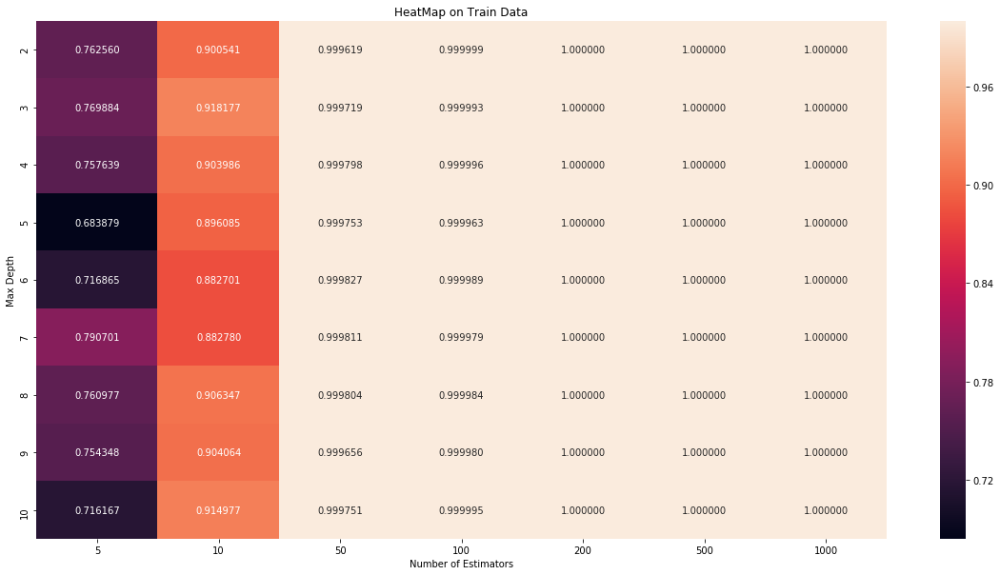

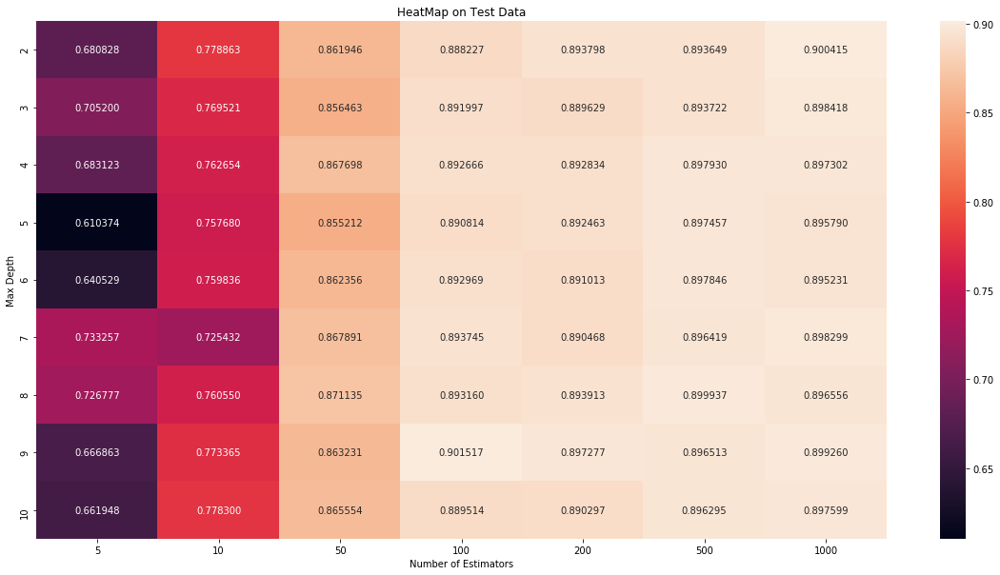

In [46]:
#plotting heatmap of maximum depth vs number of estimators
#on train and test dataset
plotHeatMap(d_train,y_train,d_test,y_test)

In [47]:
#defining the model with best parameters
rf_bow=RandomForestClassifier(n_estimators=est,max_depth=dep,class_weight='balanced')
rf_bow.fit(d_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=7, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=500, n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False)

              precision    recall  f1-score   support

           0       0.81      0.83      0.82       566
           1       0.97      0.96      0.97      2924

   micro avg       0.94      0.94      0.94      3490
   macro avg       0.89      0.90      0.89      3490
weighted avg       0.94      0.94      0.94      3490


The value of TPR is 0.963
The value of TNR is 0.834
The value of FPR is 0.166
The value of FNR is 0.037

The auc score is 0.975073


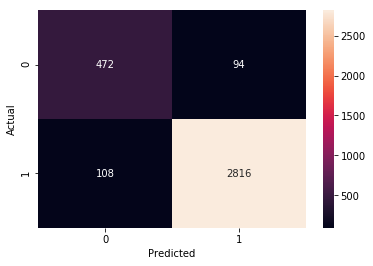

In [48]:
#report on training dataset
report(d_train,y_train,rf_bow)

              precision    recall  f1-score   support

           0       0.60      0.61      0.60       242
           1       0.92      0.92      0.92      1254

   micro avg       0.87      0.87      0.87      1496
   macro avg       0.76      0.77      0.76      1496
weighted avg       0.87      0.87      0.87      1496


The value of TPR is 0.923
The value of TNR is 0.607
The value of FPR is 0.393
The value of FNR is 0.077

The auc score is 0.881167


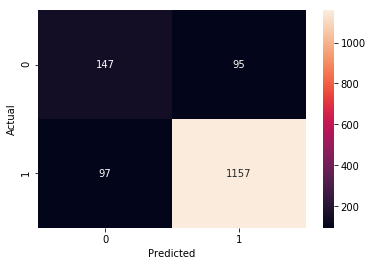

In [49]:
#report on test dataset
report(d_test,y_test,rf_bow)

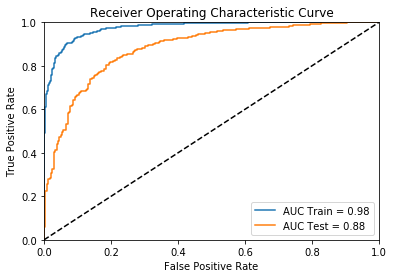

In [50]:
#plotting roc curve on training and test dataset
plotROC(d_train,y_train,d_test,y_test,rf_bow)

### [5.1.2] Wordcloud of top 20 important features from<font color='red'> SET 1</font>

In [51]:
#get feature names
feature_names=count_vect.get_feature_names()
#get feature importances
arr=rf_bow.feature_importances_
#binding feature names and corresponding importance
pos=sorted(zip(arr,feature_names))
listWords=pos[-20:]

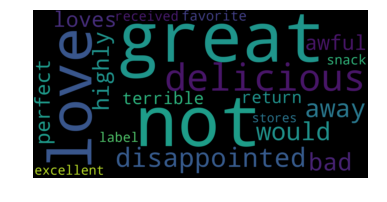

In [52]:
# Please write all the code with proper documentation
values=list()
words=list()
#creating list of values and words
for i in listWords:
    values.append(i[0])
    words.append(i[1])
#binding the words and values to convert into a dictionary
temp = zip(words, values)
dictWords = dict(temp)
#creating the word cloud
wordcloud = WordCloud(width=1600,height=800).generate_from_frequencies(dictWords)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### [5.1.3] Applying Random Forests on TFIDF,<font color='red'> SET 2</font>

In [53]:
# Please write all the code with proper documentation
#finding optimal number of estimators and maximum depth
est_tf,dep_tf = grid_Search(d_train_tf, y_train, "rf")

Time elapsed : 257.78 Seconds
 Optimal Paramters are : {'max_depth': 10, 'n_estimators': 1000}


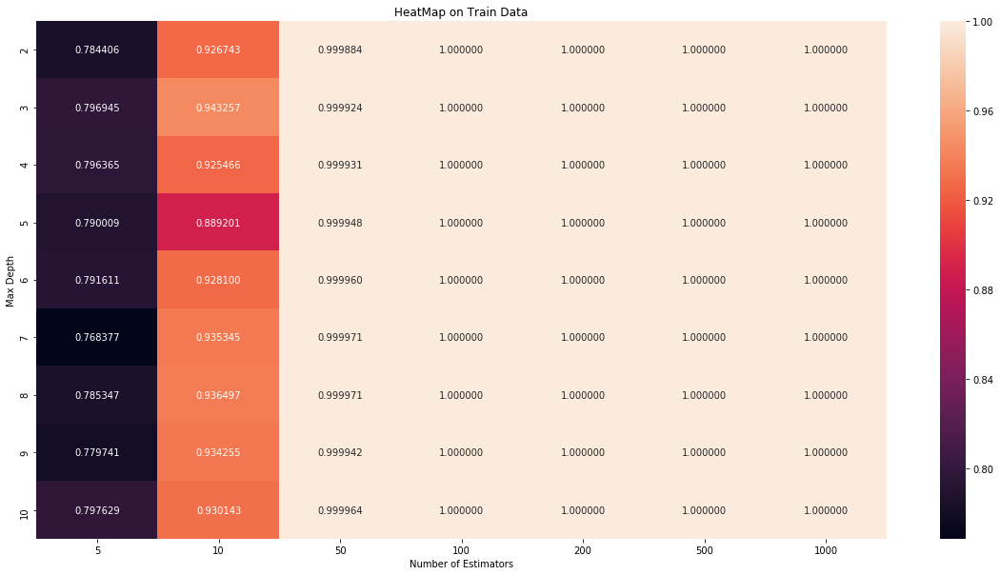

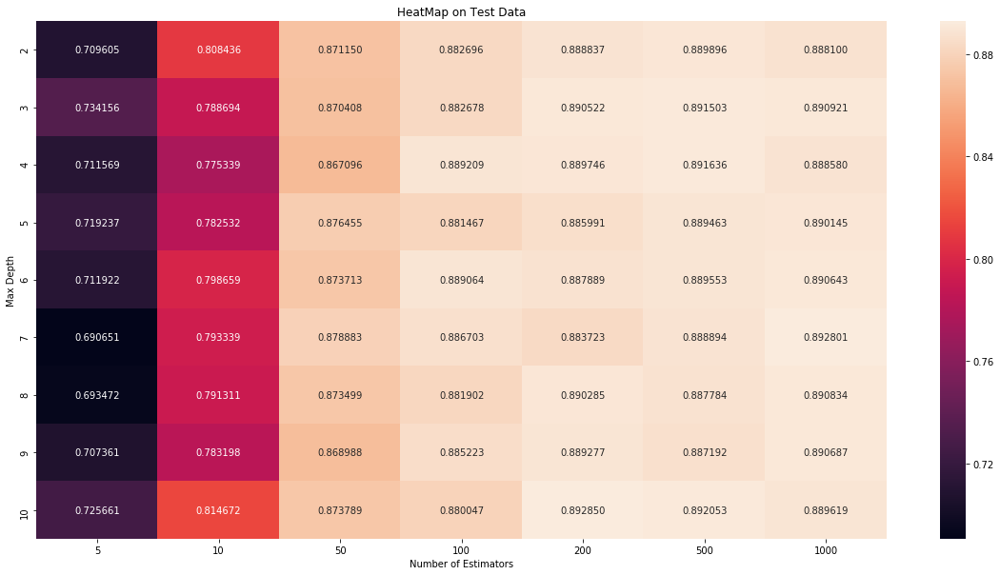

In [54]:
#plotting heatmap of maximum depth vs number of estimators
#on train and test dataset
plotHeatMap(d_train_tf,y_train,d_test_tf,y_test)

In [55]:
#defining the model with best parameters
rf_tf=RandomForestClassifier(n_estimators=est_tf,max_depth=dep_tf,class_weight='balanced')
rf_tf.fit(d_train_tf,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=10, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=1000, n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False)

              precision    recall  f1-score   support

           0       0.81      0.90      0.85       566
           1       0.98      0.96      0.97      2924

   micro avg       0.95      0.95      0.95      3490
   macro avg       0.89      0.93      0.91      3490
weighted avg       0.95      0.95      0.95      3490


The value of TPR is 0.958
The value of TNR is 0.903
The value of FPR is 0.097
The value of FNR is 0.042

The auc score is 0.986555


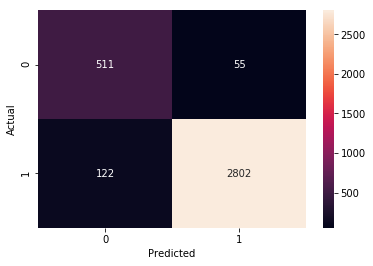

In [56]:
#report on training dataset
report(d_train_tf,y_train,rf_tf)

              precision    recall  f1-score   support

           0       0.61      0.64      0.62       242
           1       0.93      0.92      0.93      1254

   micro avg       0.88      0.88      0.88      1496
   macro avg       0.77      0.78      0.77      1496
weighted avg       0.88      0.88      0.88      1496


The value of TPR is 0.922
The value of TNR is 0.636
The value of FPR is 0.364
The value of FNR is 0.078

The auc score is 0.876636


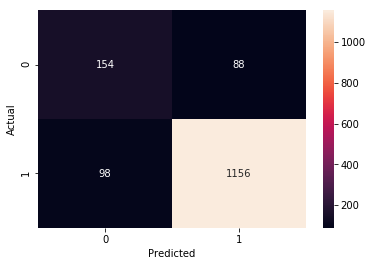

In [57]:
#report on test dataset
report(d_test_tf,y_test,rf_tf)

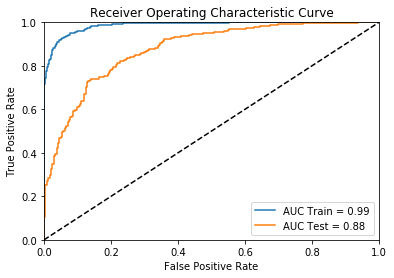

In [58]:
#plotting roc curve on training and test dataset
plotROC(d_train_tf,y_train,d_test_tf,y_test,rf_tf)

### [5.1.4] Wordcloud of top 20 important features from<font color='red'> SET 2</font>

In [59]:
#get feature names
feature_names=tf_idf_vect.get_feature_names()
#get feature importances
arr=rf_tf.feature_importances_
#binding feature names and corresponding importance
pos=sorted(zip(arr,feature_names))
listWords=pos[-20:]

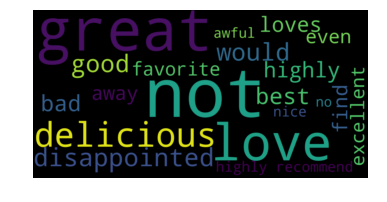

In [60]:
# Please write all the code with proper documentation
values=list()
words=list()
#creating list of values and words
for i in listWords:
    values.append(i[0])
    words.append(i[1])
#binding the words and values to convert into a dictionary
temp = zip(words, values)
dictWords = dict(temp)
#creating the word cloud
wordcloud = WordCloud(width=1600,height=800).generate_from_frequencies(dictWords)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### [5.1.5] Applying Random Forests on AVG W2V,<font color='red'> SET 3</font>

In [61]:
# Please write all the code with proper documentation
#finding optimal number of estimators and maximum depth
est_w2,dep_w2 = grid_Search(d_train_w2, y_train, "rf")

Time elapsed : 799.23 Seconds
 Optimal Paramters are : {'max_depth': 10, 'n_estimators': 500}


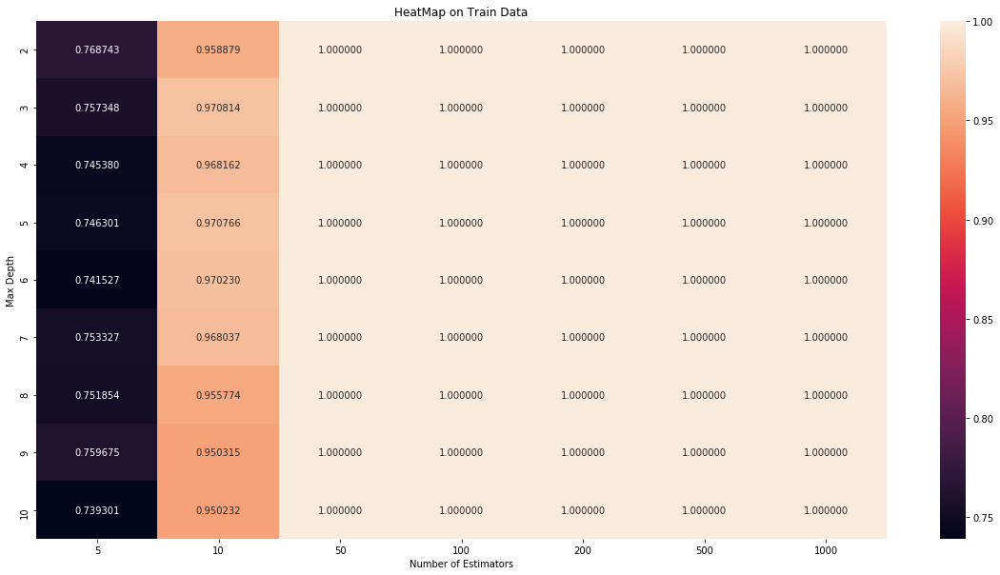

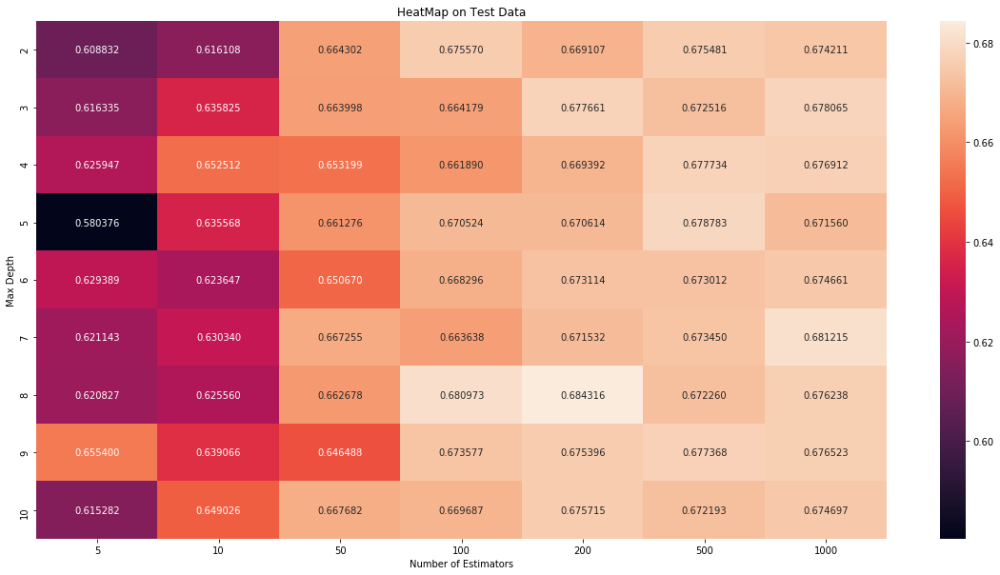

In [62]:
#plotting heatmap of maximum depth vs number of estimators
#on train and test dataset
plotHeatMap(d_train_w2,y_train,d_test_w2,y_test)

In [63]:
#defining the model with best parameters
rf_w2=RandomForestClassifier(n_estimators=est_w2,max_depth=dep_w2,class_weight='balanced')
rf_w2.fit(d_train_w2,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=10, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=500, n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False)

              precision    recall  f1-score   support

           0       0.76      0.97      0.85       566
           1       0.99      0.94      0.97      2924

   micro avg       0.95      0.95      0.95      3490
   macro avg       0.88      0.96      0.91      3490
weighted avg       0.96      0.95      0.95      3490


The value of TPR is 0.940
The value of TNR is 0.973
The value of FPR is 0.027
The value of FNR is 0.060

The auc score is 0.987680


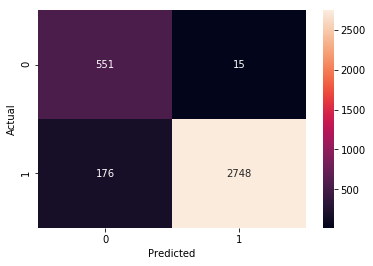

In [64]:
#report on training dataset
report(d_train_w2,y_train,rf_w2)

              precision    recall  f1-score   support

           0       0.36      0.29      0.32       242
           1       0.87      0.90      0.88      1254

   micro avg       0.80      0.80      0.80      1496
   macro avg       0.61      0.59      0.60      1496
weighted avg       0.79      0.80      0.79      1496


The value of TPR is 0.900
The value of TNR is 0.289
The value of FPR is 0.711
The value of FNR is 0.100

The auc score is 0.662205


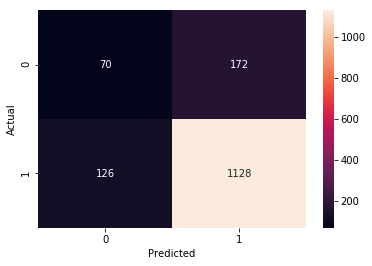

In [65]:
#report on test dataset
report(d_test_w2,y_test,rf_w2)

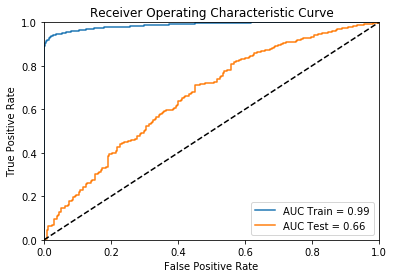

In [66]:
#plotting roc curve on training and test dataset
plotROC(d_train_w2,y_train,d_test_w2,y_test,rf_w2)

### [5.1.6] Applying Random Forests on TFIDF W2V,<font color='red'> SET 4</font>

In [67]:
# Please write all the code with proper documentation
#finding optimal number of estimators and maximum depth
est_w2_tf,dep_w2_tf = grid_Search(d_train_w2_tf, y_train, "rf")

Time elapsed : 787.97 Seconds
 Optimal Paramters are : {'max_depth': 9, 'n_estimators': 200}


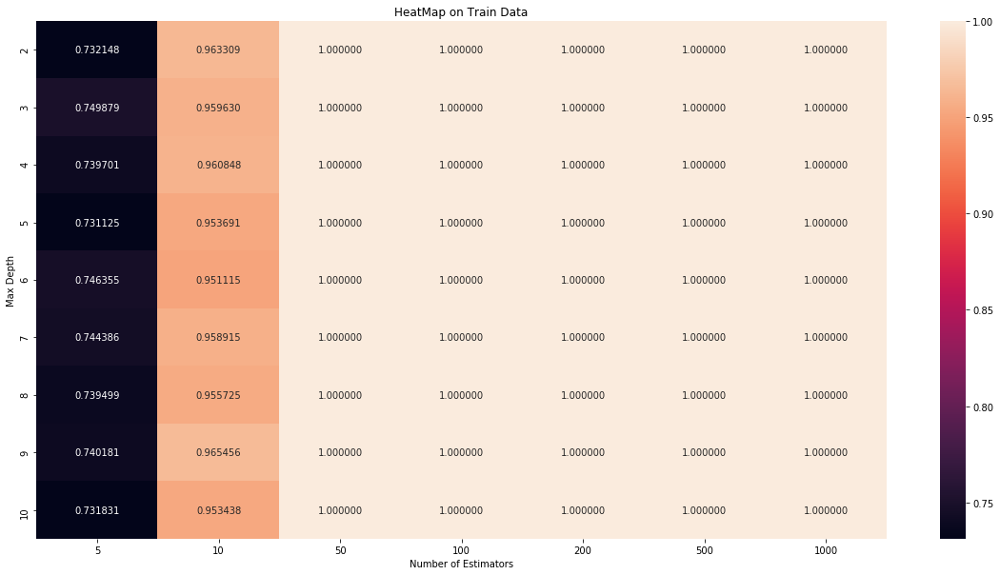

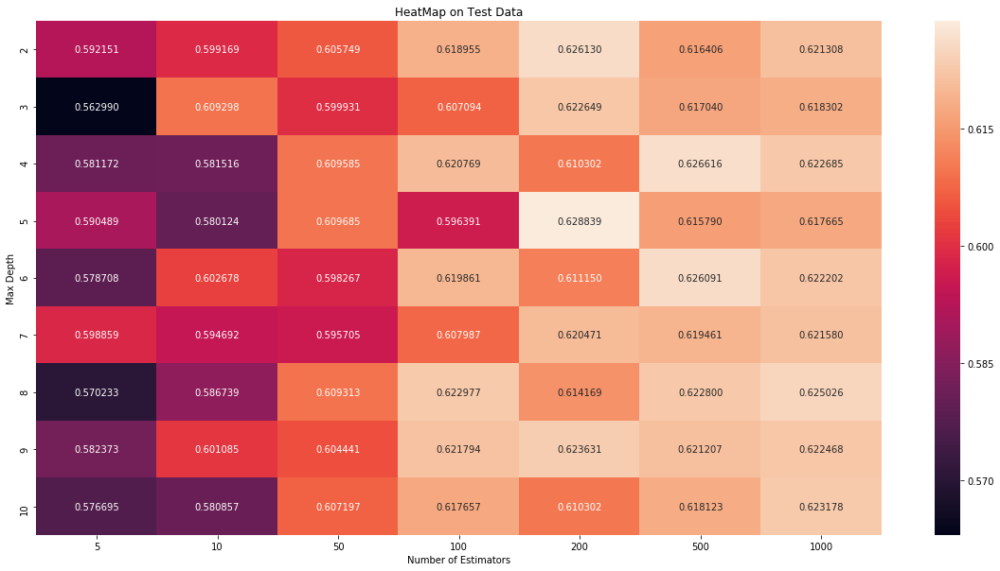

In [68]:
#plotting heatmap of maximum depth vs number of estimators
#on train and test dataset
plotHeatMap(d_train_w2_tf,y_train,d_test_w2_tf,y_test)

In [69]:
#defining the model with best parameters
rf_w2_tf=RandomForestClassifier(n_estimators=est_w2_tf,max_depth=dep_w2_tf,class_weight='balanced')
rf_w2_tf.fit(d_train_w2_tf,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=9, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=200, n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False)

              precision    recall  f1-score   support

           0       0.72      0.88      0.79       566
           1       0.98      0.93      0.95      2924

   micro avg       0.92      0.92      0.92      3490
   macro avg       0.85      0.91      0.87      3490
weighted avg       0.93      0.92      0.93      3490


The value of TPR is 0.933
The value of TNR is 0.883
The value of FPR is 0.117
The value of FNR is 0.067

The auc score is 0.976292


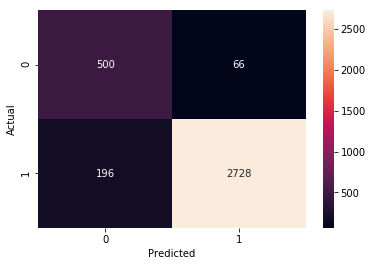

In [70]:
#report on training dataset
report(d_train_w2_tf,y_train,rf_w2_tf)

              precision    recall  f1-score   support

           0       0.30      0.24      0.27       242
           1       0.86      0.90      0.88      1254

   micro avg       0.79      0.79      0.79      1496
   macro avg       0.58      0.57      0.57      1496
weighted avg       0.77      0.79      0.78      1496


The value of TPR is 0.896
The value of TNR is 0.236
The value of FPR is 0.764
The value of FNR is 0.104

The auc score is 0.616022


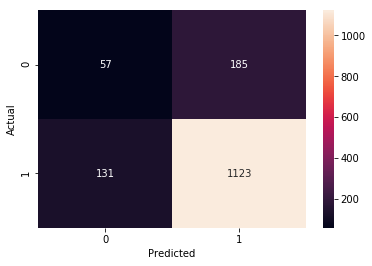

In [71]:
#report on test dataset
report(d_test_w2_tf,y_test,rf_w2_tf)

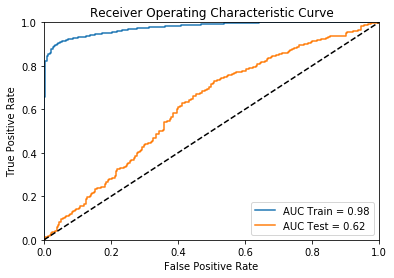

In [72]:
#plotting roc curve on training and test dataset
plotROC(d_train_w2_tf,y_train,d_test_w2_tf,y_test,rf_w2_tf)

## [5.2] Applying GBDT using XGBOOST

### [5.2.1] Applying XGBOOST on BOW,<font color='red'> SET 1</font>

In [92]:
#calculating auc score for train and test dataset
def calculateAUCScoreXG(d_trai, y_trai, d_tes, y_tes, n, str1):
    auc_train_list = list()
    auc_test_list = list()
    if("w2" in str1):
        d_trai=np.array(d_trai)
    for i in max_depth:
        for j in n_estimators:
            model = LGBMClassifier(n_estimators=j,max_depth=j,class_weight='balanced')
            model.fit(d_trai,y_train)
            xg_train = xgb.DMatrix(d_trai, label = y_train)
            train_score = model.predict_proba(d_trai)[:,1]
            test_score = model.predict_proba(d_tes)[:,1]
            fpr_train, tpr_train, _ = roc_curve(y_trai, train_score)
            fpr_test, tpr_test, _ = roc_curve(y_tes, test_score)
            auc_train_list.append(auc(fpr_train, tpr_train))
            auc_test_list.append(auc(fpr_test, tpr_test))
    return auc_train_list,auc_test_list

In [99]:
#n is the number of estimators
def plot3DScatter(d_trai, y_trai, d_tes, y_tes,n, str1):
    offline.init_notebook_mode()
    train_auc, test_auc = calculateAUCScoreXG(d_trai, y_trai, d_tes, y_tes, n, str1)
    trace1 = go.Scatter3d(x= n_estimators, y= max_depth, z= train_auc, name = 'Train AUC')
    trace2 = go.Scatter3d(x= n_estimators, y= max_depth, z= test_auc, name = 'Test AUC')
    data = [trace1, trace2]

    layout = go.Layout(title='Number Of Estimators vs Maximum Depth vs AUC Score',
                       scene = dict(xaxis = dict(title='Number Of Estimators'),
                                    yaxis = dict(title='Maximum Depth'),
                                    zaxis = dict(title='AUC Score'),))

    fig = go.Figure(data=data, layout=layout)
    offline.iplot(fig)

In [75]:
#getting the optimal value for max_depth and n_estimators using xgboost
est_xg_bow, dep_xg_bow = grid_Search(d_train,y_train, "xg-bow")

Time elapsed : 5007.04 Seconds
 Optimal Paramters are : {'max_depth': 3, 'n_estimators': 1000}


In [93]:
#getting the optimal value for max_depth and n_estimators using lightGBM
est_lg_bow, dep_lg_bow = grid_Search(d_train,y_train, "lgm-bow")

Time elapsed : 330.65 Seconds
 Optimal Paramters are : {'max_depth': 10, 'n_estimators': 1000}


In [100]:
#3D plot of number of estimators vs Maximum Depth Vs AUC Score
plot3DScatter(d_train,y_train,d_test,y_test,est_lgm_bow, "bow")

In [101]:
#model instatiate and fitting on training dataset using lightGBM
lgm_bow = LGBMClassifier(max_depth = dep_lgm_bow , n_estimators = est_lgm_bow)
lgm_bow.fit(d_train, y_train)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        importance_type='split', learning_rate=0.1, max_depth=10,
        min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
        n_estimators=1000, n_jobs=-1, num_leaves=31, objective=None,
        random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
        subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       566
           1       1.00      1.00      1.00      2924

   micro avg       1.00      1.00      1.00      3490
   macro avg       1.00      1.00      1.00      3490
weighted avg       1.00      1.00      1.00      3490


The value of TPR is 1.000
The value of TNR is 1.000
The value of FPR is 0.000
The value of FNR is 0.000

The auc score is 1.000000


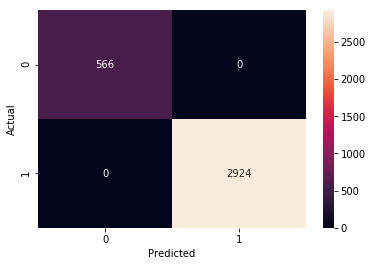

In [102]:
#report on training dataset
report(d_train,y_train,lgm_bow)

              precision    recall  f1-score   support

           0       0.64      0.43      0.52       242
           1       0.90      0.95      0.92      1254

   micro avg       0.87      0.87      0.87      1496
   macro avg       0.77      0.69      0.72      1496
weighted avg       0.86      0.87      0.86      1496


The value of TPR is 0.954
The value of TNR is 0.434
The value of FPR is 0.566
The value of FNR is 0.046

The auc score is 0.857609


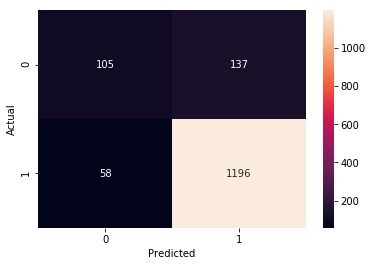

In [103]:
#report on test dataset using light gbm
report(d_test,y_test,lgm_bow)

              precision    recall  f1-score   support

           0       0.66      0.42      0.51       242
           1       0.90      0.96      0.93      1254

   micro avg       0.87      0.87      0.87      1496
   macro avg       0.78      0.69      0.72      1496
weighted avg       0.86      0.87      0.86      1496


The value of TPR is 0.959
The value of TNR is 0.417
The value of FPR is 0.583
The value of FNR is 0.041

The auc score is 0.862137


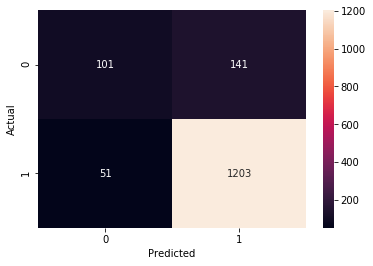

In [107]:
#model instatiate and fitting on training dataset using xgboost
xg_bow = LGBMClassifier(max_depth = dep_xg_bow , n_estimators = est_xg_bow)
xg_bow.fit(d_train, y_train)
#report on test dataset using light gbm
report(d_test,y_test,xg_bow)

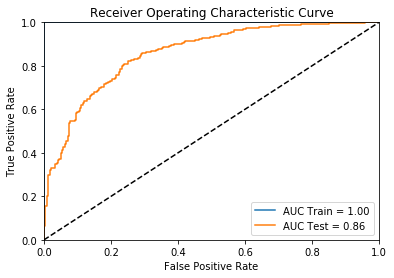

In [104]:
#plotting roc curve on training and test dataset using lightGBM
plotROC(d_train,y_train,d_test,y_test,lgm_bow)

### [5.2.2] Applying XGBOOST on TFIDF,<font color='red'> SET 2</font>

In [108]:
est_lgm_tf, dep_lgm_tf = grid_Search(d_train_tf,y_train, "lgm-tfidf")

Time elapsed : 264.19 Seconds
 Optimal Paramters are : {'max_depth': 10, 'n_estimators': 1000}


In [109]:
#3D plot of number of estimators vs Maximum Depth Vs AUC Score
plot3DScatter(d_train_tf,y_train,d_test_tf,y_test,est_lgm_tf, "tfidf")

In [110]:
#model instatiate and fitting on training dataset
lgm_tf = LGBMClassifier(max_depth = dep_lgm_tf , n_estimators = est_lgm_tf)
lgm_tf.fit(d_train_tf, y_train)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        importance_type='split', learning_rate=0.1, max_depth=10,
        min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
        n_estimators=1000, n_jobs=-1, num_leaves=31, objective=None,
        random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
        subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       566
           1       1.00      1.00      1.00      2924

   micro avg       1.00      1.00      1.00      3490
   macro avg       1.00      1.00      1.00      3490
weighted avg       1.00      1.00      1.00      3490


The value of TPR is 1.000
The value of TNR is 1.000
The value of FPR is 0.000
The value of FNR is 0.000

The auc score is 1.000000


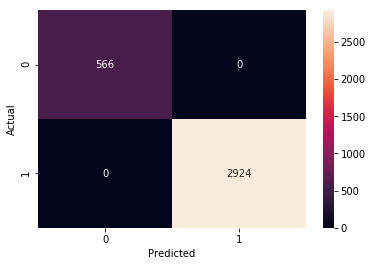

In [111]:
#report on training dataset
report(d_train_tf,y_train,lgm_tf)

              precision    recall  f1-score   support

           0       0.70      0.45      0.55       242
           1       0.90      0.96      0.93      1254

   micro avg       0.88      0.88      0.88      1496
   macro avg       0.80      0.71      0.74      1496
weighted avg       0.87      0.88      0.87      1496


The value of TPR is 0.963
The value of TNR is 0.455
The value of FPR is 0.545
The value of FNR is 0.037

The auc score is 0.866780


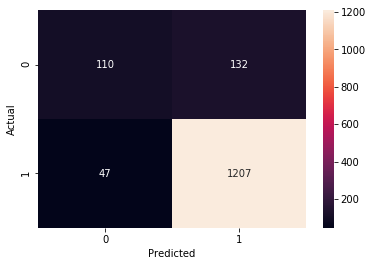

In [112]:
#report on test dataset
report(d_test_tf,y_test,lgm_tf)

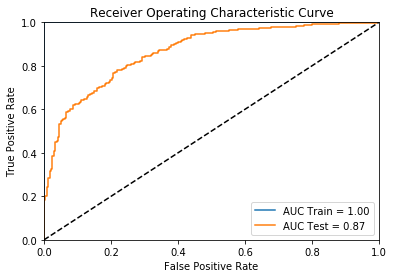

In [113]:
#plotting roc curve on training and test dataset
plotROC(d_train_tf,y_train,d_test_tf,y_test,lgm_tf)

### [5.2.3] Applying XGBOOST on AVG W2V,<font color='red'> SET 3</font>

In [114]:
# Please write all the code with proper documentation
#getting the optimal value for max_depth and n_estimators
est_lgm_w2, dep_lgm_w2 = grid_Search(d_train_w2,y_train, "lgm-av-w2v")

Time elapsed : 796.89 Seconds
 Optimal Paramters are : {'max_depth': 10, 'n_estimators': 1000}


In [115]:
#3D plot of number of estimators vs Maximum Depth Vs AUC Score
plot3DScatter(d_train_w2,y_train,d_test_w2,y_test, est_lgm_w2, "av-w2v")

In [116]:
#model instatiate and fitting on training dataset
lgm_w2 = LGBMClassifier(max_depth = dep_lgm_w2 , n_estimators = est_lgm_w2)
lgm_w2.fit(d_train_w2, y_train)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        importance_type='split', learning_rate=0.1, max_depth=10,
        min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
        n_estimators=1000, n_jobs=-1, num_leaves=31, objective=None,
        random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
        subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       566
           1       1.00      1.00      1.00      2924

   micro avg       1.00      1.00      1.00      3490
   macro avg       1.00      1.00      1.00      3490
weighted avg       1.00      1.00      1.00      3490


The value of TPR is 1.000
The value of TNR is 1.000
The value of FPR is 0.000
The value of FNR is 0.000

The auc score is 1.000000


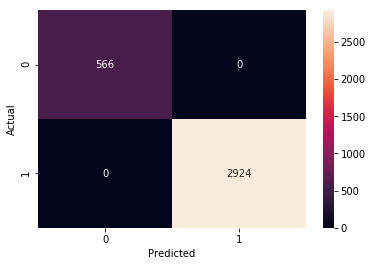

In [117]:
#report on training dataset
report(d_train_w2,y_train,lgm_w2)

              precision    recall  f1-score   support

           0       0.36      0.09      0.14       242
           1       0.85      0.97      0.90      1254

   micro avg       0.83      0.83      0.83      1496
   macro avg       0.60      0.53      0.52      1496
weighted avg       0.77      0.83      0.78      1496


The value of TPR is 0.970
The value of TNR is 0.087
The value of FPR is 0.913
The value of FNR is 0.030

The auc score is 0.682454


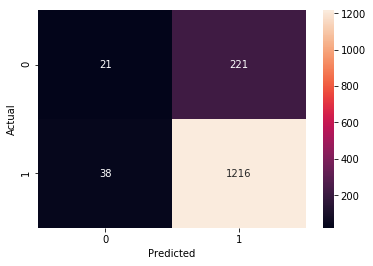

In [118]:
#report on test dataset
report(d_test_w2,y_test,lgm_w2)

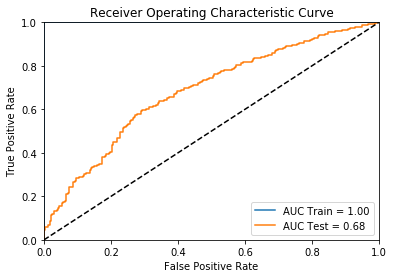

In [119]:
#plotting roc curve on training and test dataset
plotROC(d_train_w2,y_train,d_test_w2,y_test,lgm_w2)

### [5.2.4] Applying XGBOOST on TFIDF W2V,<font color='red'> SET 4</font>

In [120]:
# Please write all the code with proper documentation
#getting the optimal value for max_depth and n_estimators
est_lgm_w2_tf, dep_lgm_w2_tf = grid_Search(d_train_w2_tf,y_train, "lgm-tfidf-w2v")

Time elapsed : 780.59 Seconds
 Optimal Paramters are : {'max_depth': 9, 'n_estimators': 200}


In [121]:
#3D plot of number of estimators vs Maximum Depth Vs AUC Score
plot3DScatter(d_train_w2_tf,y_train,d_test_w2_tf,y_test, est_lgm_w2, "tfidf-w2v")

In [123]:
#model instatiate and fitting on training dataset
lgm_w2_tf = LGBMClassifier(max_depth = dep_lgm_w2_tf , n_estimators = est_lgm_w2_tf)
lgm_w2_tf.fit(d_train_w2_tf, y_train)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        importance_type='split', learning_rate=0.1, max_depth=9,
        min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
        n_estimators=200, n_jobs=-1, num_leaves=31, objective=None,
        random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
        subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       566
           1       1.00      1.00      1.00      2924

   micro avg       1.00      1.00      1.00      3490
   macro avg       1.00      1.00      1.00      3490
weighted avg       1.00      1.00      1.00      3490


The value of TPR is 1.000
The value of TNR is 0.995
The value of FPR is 0.005
The value of FNR is 0.000

The auc score is 1.000000


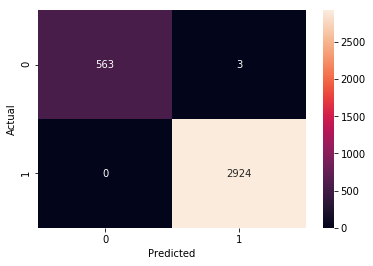

In [124]:
#report on training dataset
report(d_train_w2_tf,y_train,lgm_w2_tf)

              precision    recall  f1-score   support

           0       0.44      0.10      0.16       242
           1       0.85      0.98      0.91      1254

   micro avg       0.83      0.83      0.83      1496
   macro avg       0.64      0.54      0.53      1496
weighted avg       0.78      0.83      0.79      1496


The value of TPR is 0.975
The value of TNR is 0.099
The value of FPR is 0.901
The value of FNR is 0.025

The auc score is 0.625417


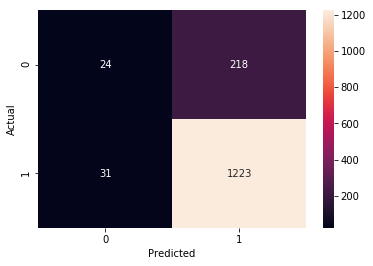

In [125]:
#report on test dataset
report(d_test_w2_tf,y_test,lgm_w2_tf)

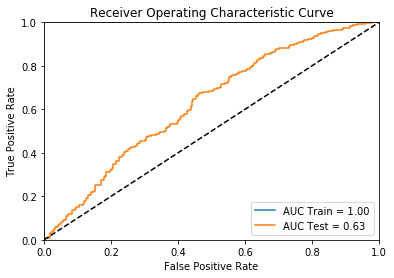

In [126]:
#plotting roc curve on training and test dataset
plotROC(d_train_w2_tf,y_train,d_test_w2_tf,y_test,lgm_w2_tf)

# [6] Conclusions

In [1]:
# Please compare all your models using Prettytable library
from prettytable import PrettyTable
    
pt = PrettyTable()

pt.field_names = ["Algorithm", "Vectorising Method","Max Depth", "Number Of Estimators", "AUC Score","Precision", "Recall", "F1-Score"]

pt.add_row(["Random Forest","Bag Of Words",7, 500 , 0.881, 0.87, 0.87, 0.87 ])
pt.add_row(["","Tf-Idf",10, 1000, 0.876, 0.88, 0.88, 0.88 ])
pt.add_row(["","AV-W2V",10, 500, 0.662, 0.79, 0.80, 0.79 ])
pt.add_row(["","TfIdf-W2V",9, 200, 0.616, 0.77, 0.79, 0.78 ])
pt.add_row(["","","","","","","",""])
pt.add_row(["XG-Boost","Bag Of Words", 3, 1000, 0.862, 0.86, 0.87, 0.86 ])
pt.add_row(["LightGBM","Bag Of Words",10, 1000 , 0.858, 0.86, 0.87, 0.86 ])
pt.add_row(["","","","","","","",""])
pt.add_row(["LightGBM","Tf-Idf", 10, 1000, 0.867, 0.87, 0.88, 0.87 ])
pt.add_row(["","AV-W2V",10, 1000, 0.682, 0.77, 0.83, 0.78 ])
pt.add_row(["","TfIdf-W2V", 9, 200, 0.625, 0.78, 0.83, 0.79 ])

print(pt)
print("\n\n Note: Auc Score, Precision, Recall and F1- Score are on Test Data")

+---------------+--------------------+-----------+----------------------+-----------+-----------+--------+----------+
|   Algorithm   | Vectorising Method | Max Depth | Number Of Estimators | AUC Score | Precision | Recall | F1-Score |
+---------------+--------------------+-----------+----------------------+-----------+-----------+--------+----------+
| Random Forest |    Bag Of Words    |     7     |         500          |   0.881   |    0.87   |  0.87  |   0.87   |
|               |       Tf-Idf       |     10    |         1000         |   0.876   |    0.88   |  0.88  |   0.88   |
|               |       AV-W2V       |     10    |         500          |   0.662   |    0.79   |  0.8   |   0.79   |
|               |     TfIdf-W2V      |     9     |         200          |   0.616   |    0.77   |  0.79  |   0.78   |
|               |                    |           |                      |           |           |        |          |
|    XG-Boost   |    Bag Of Words    |     3     |      

1) The highest AUC score is achieved after vectorization of reviews using *Bag Of Words* method and using the *Random forest* model. The AUC score is 0.881 on Test Data.

2) The best value of max_depth and number of estimators, the hyperparameters, remains same from grid search and from the heatmaps on train and test datasets in case of *Random Forest* and from 3D-Plot in case of *LightGBM*.

3) Top 20 most important features are almost same between Bag of Words and Tf-Idf. And hence the word cloud is also almost same in both the cases.

4) The lowest ROC-AUC score is achieved after vectorization by *Tf-Idf weighted Word2Vec*. The reason being the dimensionality as these models perform better when dimension is large. The score is 0.616 on Test Data.

5) We can say that model is good in predicting positive reviews looking at the Precision, Recall and F1-score, when we are vectorizing with *Bag of words* and *Tf-idf* while it is descent in predicting positive reviews in case of *Average Word2Vec* and *Tf-Idf weighted Word2Vec*.

6) The LightGBM performs almost similar to XGBoost. But in case of XGBoost the time taken for grid search is 1.39 Hrs whilst in case of LightGBM the time taken for Grid Search is 5.5 Minutes.